In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
from numpy import *
from datetime import datetime
import math
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import re
import random
from util import inspect_patterns

## I. Load Data

In [3]:
trail = pd.read_csv('data/Trail_eco_counter_hourly_data_after_QA_before_days_of_year_threshold.csv', 
                        usecols = lambda x: 'Unnamed' not in x,
                        parse_dates = ['Start Time'],  
                        date_parser = lambda x: pd.to_datetime(x, format = "%H:%M:%S").time())

nontrail = pd.read_csv('data/Non_Trail_eco_counter_hourly_data_after_QA_before_days_of_year_threshold.csv', 
                        usecols = lambda x: 'Unnamed' not in x,
                        parse_dates = ['Start Time'], 
                        date_parser = lambda x: pd.to_datetime(x, format = "%H:%M:%S").time())

longterm = pd.concat([trail, nontrail])                       
print(len(trail), len(nontrail))
print("There're {} trail long-term count sites, {} non-trail long-term count sites ({} in total).".format(trail.site_id.nunique(), nontrail.site_id.nunique(), longterm.site_id.nunique()))


C:\Users\Qianhua\AppData\Local\Temp\ipykernel_10724\1855355321.py:1: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  trail = pd.read_csv('data/Trail_eco_counter_hourly_data_after_QA_before_days_of_year_threshold.csv',
C:\Users\Qianhua\AppData\Local\Temp\ipykernel_10724\1855355321.py:6: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  nontrail = pd.read_csv('data/Non_Trail_eco_counter_hourly_data_after_QA_before_days_of_year_threshold.csv',


3536371 1772821
There're 92 trail long-term count sites, 61 non-trail long-term count sites (153 in total).


In [4]:
longterm.hourly_counts.describe()

count    5.309192e+06
mean     2.165546e+01
std      5.949913e+01
min      0.000000e+00
25%      0.000000e+00
50%      4.000000e+00
75%      1.800000e+01
max      5.655000e+03
Name: hourly_counts, dtype: float64

In [15]:
locations = pd.read_csv('data/Locations_combine_site.csv', dtype = {'site_id': object})

## II. Data Cleaning

In [9]:
# 1. group nearby locations
# 2. check days with zero counts
# 3. impute missing hour counts
# 4. outliers identification methods

### 1. Nearby locations

In [66]:
# https://stackoverflow.com/questions/21807654/grouping-a-set-of-points-by-proximity
def distance(p1, p2):
    
    lat1, lon1 = p1[0]/180*pi, p1[1]/180*pi
    lat2, lon2 = p2[0]/180*pi, p2[1]/180*pi
    return arccos(sin(lat1) * sin(lat2) + cos(lat1) * cos(lat2) * cos(lon1-lon2)) * 6371 * 1000    

In [67]:
locations = locations.sort_values(by = ['latitude', 'longitude'])
locations['latitude_nx'] = locations['latitude'].shift(-1)
locations['longitude_nx'] = locations['longitude'].shift(-1)

locations['dist_w_nx'] = locations.apply(lambda x: distance((x.latitude, x.longitude), (x.latitude_nx, x.longitude_nx)), axis = 1)
locations['dist_w_pr'] = locations['dist_w_nx'].shift(1)

locations['flag'] = locations.apply(lambda x: True if ((x.dist_w_nx < 55) or (x.dist_w_pr < 55)) else False, axis = 1)

In [68]:
locations[locations.site_id.isin([100014389, 100014390, 100013837])]

,site_id,site_name,Facility_Class,Bicycle_Fa,latitude,longitude,Classification,notes,latitude_nx,longitude_nx,dist_w_nx,dist_w_pr,flag


In [34]:
# Visualize the sites
import plotly.express as px

fig = px.scatter_mapbox(locations, 
                        lat = 'latitude', lon = 'longitude', 
                        hover_name = 'site_id', 
                        color = 'flag',
                        zoom = 8, height = 600, width = 1600)

fig.update_layout(mapbox_style = 'open-street-map')
fig.show()

ValueError: Value of 'color' is not the name of a column in 'data_frame'. Expected one of ['site_id', 'site_name', 'Facility_Class', 'Bicycle_Fa', 'latitude', 'longitude', 'Classification', 'notes'] but received: flag

In [70]:
def compare_data(loc_ls):
    
    s1 = longterm[longterm.site_id == loc_ls[0]][['timestamp', 'hourly_counts']].reset_index(drop = True)
    for i in range(1, len(loc_ls)):
        s = longterm[longterm.site_id == loc_ls[i]][['timestamp', 'hourly_counts']].reset_index(drop = True)
        if s.equals(s1):
            print('The two records are the same.')
        elif not s.equals(s1):
            print('The two records are different.')
    
    years = []
    for loc in loc_ls:
        df = longterm[longterm.site_id == loc].groupby(['year', 'month'])['Number_of_days_data_collected'].mean().unstack()
        years.append(df.index)
        display(df)
    
    return np.intersect1d(years[0], years[1])

In [71]:
def visualize_pair_htw_patterns(years, loc_ls):
    
    fig, axes = plt.subplots(nrows = len(years), ncols = 1, figsize = (4 * len(loc_ls), 4 * len(years)))
    
    if len(years) == 1:
        fig.suptitle('Activity Patterns in {}'.format(years[0]))
        axes.axis('off')
    else:
        for row, ax in enumerate(axes):
            ax.set_title('Patterns {}'.format(years[row]), fontsize = 10)
            ax.axis('off')
            ax._frameon = False
        
    for j in range(len(years)):
        for i in range(len(loc_ls)):   
            ax = fig.add_subplot(len(years),len(loc_ls),j*len(loc_ls)+i+1)
            longterm[(longterm.site_id == loc_ls[i]) & (longterm.year == years[j])].groupby(['dayofweek', 'Start Time'])['hourly_counts'].mean().plot(ax = ax)
            ax.set_xticks([12, 36, 60, 84, 108, 132, 156], ['Mon', 'Tu', 'Wed', 'Th', 'Fri', 'Sat', 'Sun'])
            ax.set_xlabel('')
#             if i == 0:
#                 first_ax = ax
#             else:
#                 ax.sharey(first_ax)
                    
    plt.show()
    

In [72]:
def locate_pairs(loc_ls):
    fig = px.scatter_mapbox(locations[locations.site_id.isin(loc_ls)],
                            lat = 'latitude', lon = 'longitude',
                            hover_name = 'site_name',
                            color = 'flag',
                            zoom = 8, height = 600, width = 1600)
    fig.update_layout(mapbox_style = 'open-street-map')
    fig.show()

In [73]:
location_pairs = locations[locations.flag == True].reset_index(drop = True)

In [74]:
location_pairs.head()

,site_id,site_name,Facility_Class,Bicycle_Fa,latitude,longitude,Classification,notes,latitude_nx,longitude_nx,dist_w_nx,dist_w_pr,flag
0,300020986,"Broadway between 97th St to 98th St, east side",Non_Trail,Bike Lane,33.947650,-118.278058,Non_Trail,NaN,33.947694,-118.278443,35.873988,27747.044846,True
1,300020985,"Broadway between 97th St to 98th St, west side",Non_Trail,Bike Lane,33.947694,-118.278443,Non_Trail,NaN,33.997226,-118.265267,5640.149212,35.873988,True
2,300024183,"Venice Blvd and Mountain View Ave, south side",Non_Trail,Bike Lane,34.005762,-118.429518,Non_Trail,NaN,34.006015,-118.429527,28.196902,15178.735156,True
3,300024181,Venice Blvd between Mountain View Ave and Ingl...,Non_Trail,Bike Lane,34.006015,-118.429527,Non_Trail,same as the above one,34.011245,-118.285121,13323.329922,28.196902,True
4,300018161,Hoover (SLID: 141566),Non_Trail,Bike Lane,34.026238,-118.284059,Non_Trail,NaN,34.026497,-118.283859,34.184486,1670.019749,True


In [77]:
# 7 - 12, counters at different side
i = 2
loc_pair = location_pairs.iloc[[i*2, i*2+1]]
loc_ls = loc_pair['site_id'].to_list()
loc_pair

,site_id,site_name,Facility_Class,Bicycle_Fa,latitude,longitude,Classification,notes,latitude_nx,longitude_nx,dist_w_nx,dist_w_pr,flag,n_yr,year,name_year
4,100003845,SD University Ave EB & WB - Ped,Trail,Path,32.748295,-117.161110,Non_Trail,NaN,32.748299,-117.161287,16.540007,3028.274306,True,6,"[2013, 2014, 2015, 2016, 2017, 2020]",SD University Ave EB & WB - Ped [2013 2014 201...
5,100061380,junker,Trail,Path,32.748299,-117.161287,Non_Trail,NaN,32.760265,-117.202200,4050.756129,16.540007,True,3,"[2018, 2019, 2020]",junker [2018 2019 2020]


In [82]:
years = compare_data(loc_ls)

The two records are different.


month,1,2,3,4,5,6,7,8,9,10,11,12
year,,,,,,,,,,,,
2013,31.0,28.0,31.0,30.0,31.0,30.0,30.0,31.0,30.0,31.0,29.0,31.0
2014,31.0,27.0,31.0,30.0,31.0,30.0,31.0,31.0,30.0,30.0,30.0,31.0
2015,30.0,28.0,31.0,30.0,30.0,25.0,31.0,31.0,30.0,31.0,30.0,29.0
2016,30.0,29.0,31.0,29.0,31.0,30.0,31.0,31.0,29.0,30.0,28.0,31.0
2017,31.0,28.0,31.0,30.0,31.0,30.0,29.0,31.0,30.0,31.0,24.0,NaN
2020,NaN,NaN,NaN,NaN,NaN,22.0,31.0,31.0,30.0,29.0,NaN,NaN


month,1,3,4,11,12
year,,,,,
2018,NaN,NaN,NaN,NaN,26.0
2019,30.0,NaN,NaN,25.0,21.0
2020,NaN,24.0,24.0,NaN,NaN


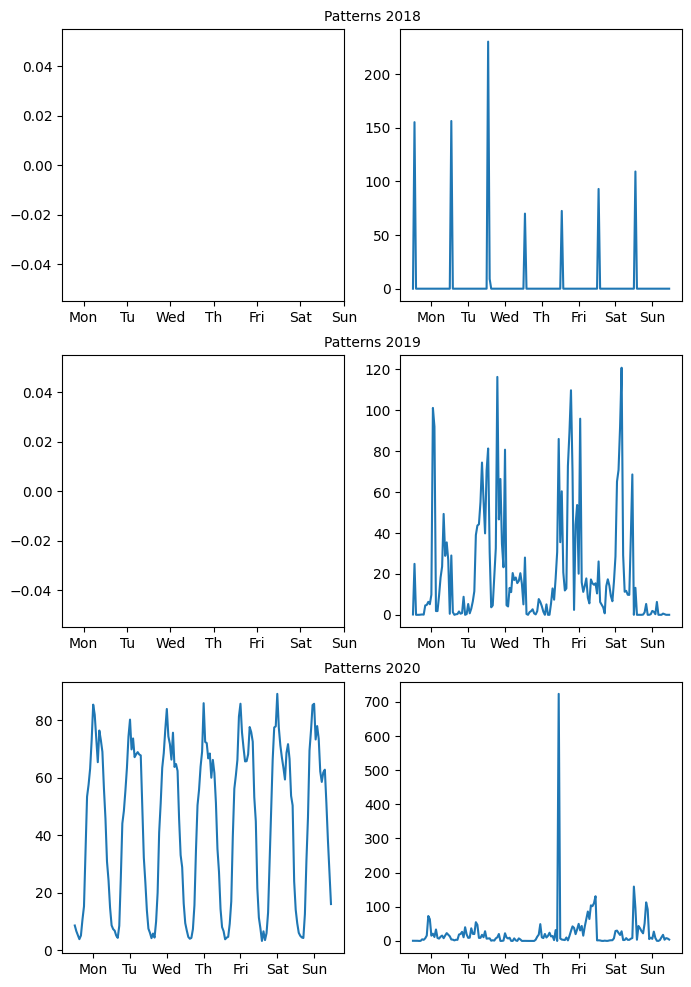

In [83]:
years = [2018, 2019, 2020]
visualize_pair_htw_patterns(years, loc_ls)

In [151]:
locate_pairs(loc_ls)

In [5]:
# different sides of the road / one site has two closeby counters - keep both
# presidio counters, keep both.
# similar and trash counters, keep one
notkeep = [100003575, 100003571, 100005838, 100003562, 100013756, 100030667, # same & similar records
           100061380,  100063158, # two trash counters
          ]
# complement records, combine
complement1 = [100039878, 100005462]
complement2 = [300025945, 100021712]
# tri - keep all
# four counters - keep all

In [6]:
# combine counters with complementary records
longterm.loc[longterm.site_id.isin(complement1), 'site_id'] = int(str(complement1[0]) + str(complement1[1]))
longterm.loc[longterm.site_id.isin(complement2), 'site_id'] = int(str(complement2[0]) + str(complement2[1]))

# drop one of the duplicate counters
longterm = longterm[~longterm.site_id.isin(notkeep)]

In [7]:
longterm.site_id.nunique()

143

In [26]:
# longterm.to_csv('data/longterm_combine_site.csv', index = False)

In [69]:
# create a new longterm locations info spreadsheet
# locations = locations[~locations.site_id.isin(notkeep)]

In [70]:
# locations[locations.site_id.isin(complement1+complement2)]

,site_id,site_name,Facility_Class,Bicycle_Fa,latitude,longitude,Classification,notes
25,300025945,Bldg 106 Entrance,Non_Trail,Bike Route,37.802312,-122.457626,Trail,?
85,100005462,MP1,Trail,Path,37.620060,-122.492035,Trail,NaN
86,100039878,MP1,Trail,Path,37.619911,-122.491446,Trail,NaN
101,100021712,PProm@B106,Non_Trail,Bike Route,37.802320,-122.457968,Trail,?occur several times


In [71]:
# Combine the two locations
# lat1, lon1 = locations[locations.site_id == complement1[0]].latitude.values[0], locations[locations.site_id == complement1[0]].longitude.values[0]
# lat2, lon2 = locations[locations.site_id == complement1[1]].latitude.values[0], locations[locations.site_id == complement1[1]].longitude.values[0]
# locations.loc[locations.index.max()+1] = dict(zip(locations.columns,[int(str(complement1[0]) + str(complement1[1])), 'MP1', 'Trail', 'Path', (lat1+lat2)/2, (lon1+lon2)/2, 'Trail',]))

# lat1, lon1 = locations[locations.site_id == complement2[0]].latitude.values[0], locations[locations.site_id == complement2[0]].longitude.values[0]
# lat2, lon2 = locations[locations.site_id == complement2[1]].latitude.values[0], locations[locations.site_id == complement2[1]].longitude.values[0]
# locations.loc[locations.index.max()+1] = dict(zip(locations.columns, [int(str(complement2[0]) + str(complement2[1])), 'Bldg106', 'Non_Trail', 'Bike Route', (lat1+lat2)/2, (lon1+lon2)/2, 'Trail',]))

In [72]:
# locations_combine_site = locations[~locations.site_id.isin(complement1+complement2)]

In [75]:
# locations_combine_site.to_csv('data/Locations_clean.csv', index = False)

In [35]:
# Visualize the sites
import plotly.express as px

fig = px.scatter_mapbox(locations, 
                        lat = 'latitude', lon = 'longitude', 
                        hover_name = 'site_id', 
                        zoom = 8, height = 600, width = 1600)

fig.update_layout(mapbox_style = 'open-street-map')
fig.show()

### 2. Days with zero counts

In [8]:
df = pd.DataFrame(longterm.groupby(['site_id', 'year', 'month', 'day', 'dayofweek'])['hourly_counts'].sum()).reset_index()
df_zero_counts = df[df.hourly_counts == 0]
print('{} days from {} counters have zero daily counts.'.format(len(df_zero_counts), df_zero_counts.site_id.nunique()))
print('Among which, {} ({:.1f}%) are weekends.'.format(len(df_zero_counts[df_zero_counts.dayofweek >= 5]), len(df_zero_counts[df_zero_counts.dayofweek >= 5])/len(df_zero_counts)*100))

836 days from 65 counters have zero daily counts.
Among which, 300 (35.9%) are weekends.


In [9]:
df_zero_counts.groupby('site_id').size().sort_values(ascending = False).head(10)

site_id
100040948    122
100040947    108
100040946     77
100013760     70
100002698     43
100023303     33
100051027     29
100024193     26
100049628     25
100023307     24
dtype: int64

In [10]:
# Inspect the distribution of zero count days
def plot_dist_zero_count_days(df_zero_counts, site_id = None):
    
    fig, axes = plt.subplots(1,3, figsize = (21, 6))

    if site_id:
        df_zero_counts = df_zero_counts[df_zero_counts.site_id == site_id]
    df_zero_counts.dayofweek.reset_index().groupby('dayofweek').count().plot(kind = 'bar', ax = axes[0])
    axes[0].set_xticks([i for i in range(7)], ['Mon', 'Tu', 'Wed', 'Th', 'Fri', 'Sat', 'Sun'], rotation = 0)
    axes[0].set_ylabel('Frequency')
    df_zero_counts.month.reset_index().groupby('month').count().plot(kind = 'bar', ax = axes[1])
    axes[1].set_xticks([i for i in range(12)], ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'], rotation = 0)
    df_zero_counts.year.reset_index().groupby('year').count().plot(kind = 'bar', ax = axes[2], rot = 0)
    
    for ax in axes:
        for bar in ax.patches:
            ax.annotate(format(bar.get_height(), '.0f'),
                        (bar.get_x() + bar.get_width() / 2,
                         bar.get_height()), ha = 'center', va = 'center',
                         size = 11, xytext = (0, 8),
                         textcoords = 'offset points')
    plt.grid(alpha = .5)
    plt.suptitle('Distribution of Zero-count Day {}'.format('of Site ' + str(site_id) if site_id else ''))

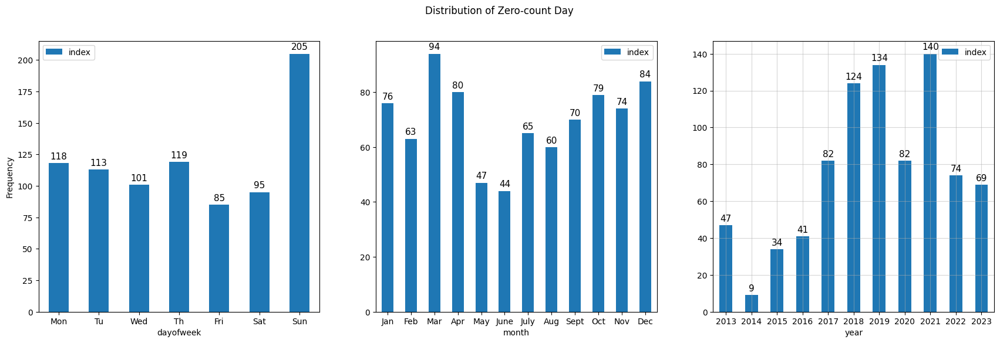

In [11]:
plot_dist_zero_count_days(df_zero_counts)

In [13]:
# plot_dist_zero_count_days(df_zero_counts, 100024193)

### 3. Impute missing hour counts

In [14]:
s = longterm[longterm.Number_of_hrs_data_collected < 24].groupby(['site_id', 'year', 'month', 'day', 'Start Time'])['hourly_counts'].mean().unstack().isna().sum()
print('There are {} missing hourly counts, {} ({:.1f}%) is from 22:00 to 6:00.'.format(s.sum(), s[:6].sum() + s[22:].sum(), (s[:6].sum() + s[22:].sum())/s.sum() * 100)) 

There are 1461 missing hourly counts, 1288 (88.2%) is from 22:00 to 6:00.


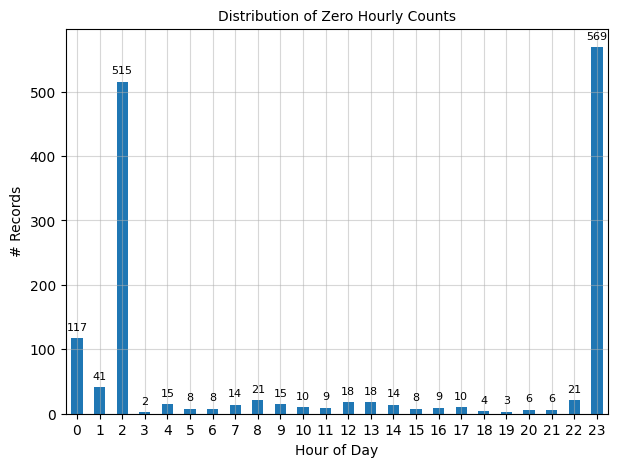

In [15]:
ax = s.plot(kind = 'bar', figsize = (7, 5), rot = 0)
ax.set_xticklabels([i for i in range(24)])
ax.set_xlabel('Hour of Day')
ax.set_ylabel('# Records')
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.0f'),
                (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                ha = 'center', va = 'center',
                size = 8, xytext = (0, 8),
                textcoords = 'offset points')
plt.grid(alpha = .5)
plt.title('Distribution of Zero Hourly Counts', fontsize = 10)
plt.show()

### 4. Outlier identification

In [88]:
aaht = longterm.groupby(['site_id', 'dayofweek', 'Start Time'])['hourly_counts'].mean().unstack(['site_id']).T
wat = aaht.sum(axis = 1)
hour_to_week_expansion_factor = aaht.div(wat, axis = 0)

In [89]:
hour_to_week_expansion_factor

dayofweek          0                                                    \
Start Time  00:00:00  01:00:00  02:00:00  03:00:00  04:00:00  05:00:00   
site_id                                                                  
100000595   0.000025  0.000017  0.000010  0.000009  0.000035  0.000268   
100000671   0.000020  0.000006  0.000011  0.000012  0.000034  0.000289   
100002694   0.000020  0.000018  0.000038  0.000190  0.000277  0.000416   
100002695   0.000060  0.000051  0.000038  0.000102  0.000047  0.000175   
100002696   0.000000  0.000032  0.000000  0.000048  0.000016  0.000144   
...              ...       ...       ...       ...       ...       ...   
300025949   0.000078  0.000027  0.000030  0.000030  0.000013  0.000601   
300025950   0.000000  0.000000  0.000000  0.000006  0.000000  0.000029   
300028876   0.000000  0.000000  0.000000  0.000000  0.000295  0.000591   
300032304   0.000190  0.000190  0.000095  0.000190  0.000000  0.000095   
300032536   0.000030  0.000020  0.000000  0.000015  0.000000  0.000015   

dayofweek                                           ...         6            \
Start Time  06:00:00  07:00:00  08:00:00  09:00:00  ...  14:00:00  15:00:00   
site_id                                             ...                       
100000595   0.001546  0.004235  0.007246  0.010381  ...  0.023674  0.023751   
100000671   0.002973  0.005983  0.010088  0.014866  ...  0.016901  0.017309   
100002694   0.002236  0.004583  0.007556  0.012842  ...  0.017943  0.016690   
100002695   0.001798  0.006021  0.007563  0.006975  ...  0.010410  0.010167   
100002696   0.001183  0.002614  0.004069  0.005508  ...  0.023349  0.037571   
...              ...       ...       ...       ...  ...       ...       ...   
300025949   0.000816  0.002352  0.004268  0.005604  ...  0.038389  0.036056   
300025950   0.000097  0.000115  0.000172  0.000768  ...  0.049243  0.050871   
300028876   0.001181  0.000295  0.001476  0.002657  ...  0.002025  0.002278   
300032304   0.002666  0.004094  0.009806  0.016850  ...  0.006093  0.007045   
300032536   0.000847  0.002338  0.004423  0.010243  ...  0.021636  0.021373   

dayofweek                                                               \
Start Time  16:00:00  17:00:00  18:00:00  19:00:00  20:00:00  21:00:00   
site_id                                                                  
100000595   0.019793  0.011677  0.005605  0.002185  0.000646  0.000110   
100000671   0.016480  0.011768  0.005863  0.002470  0.000742  0.000194   
100002694   0.014795  0.010600  0.006163  0.002954  0.000755  0.000061   
100002695   0.010460  0.008019  0.006415  0.003623  0.000564  0.000109   
100002696   0.042366  0.020781  0.002674  0.000943  0.000187  0.000024   
...              ...       ...       ...       ...       ...       ...   
300025949   0.027128  0.016416  0.008564  0.003720  0.001319  0.000548   
300025950   0.049879  0.004562  0.002693  0.001209  0.000212  0.000160   
300028876   0.001518  0.000253  0.000000  0.000000  0.000000  0.000000   
300032304   0.005902  0.013423  0.007140  0.003903  0.002666  0.001523   
300032536   0.017792  0.013384  0.007088  0.002898  0.001070  0.000198   

dayofweek                       
Start Time  22:00:00  23:00:00  
site_id                         
100000595   0.000054  0.000042  
100000671   0.000065  0.000255  
100002694   0.000024  0.000010  
100002695   0.000067  0.000067  
100002696   0.000016  0.000033  
...              ...       ...  
300025949   0.000243  0.000113  
300025950   0.000097  0.000011  
300028876   0.000000  0.000000  
300032304   0.000476  0.001714  
300032536   0.000253  0.000079  

[153 rows x 168 columns]

In [85]:
X = hour_to_week_expansion_factor.to_numpy()

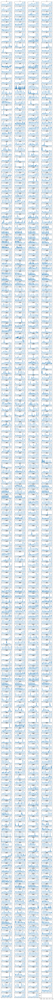

In [306]:
inspect_patterns(X)

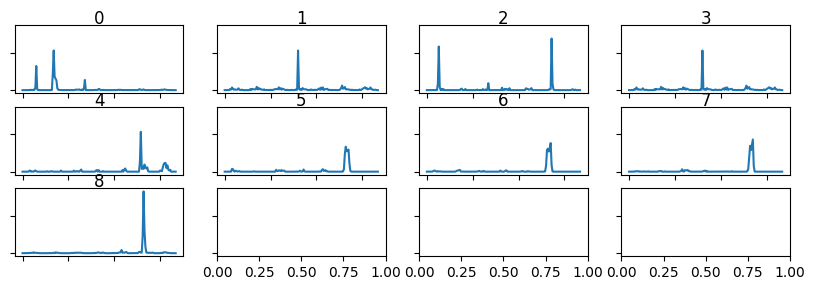

In [338]:
# 1. consistent zero count with one or two abrupt increase - 36, 114, 125, 286, 433, 554, 555, 556, 748
# 2. alternate between 0 and abrupt increase - 640, 641, 643, 644, 355, 
# 3. random patterns - 257, 48, 65
# 4. abrupt increase but otherwise normal pattern - 35, 56, 78, 80, 84, 108, 111, 115, 121, 245, 254, 255, 260, 262, 266, 274, 311, 315, 316, 319, 395
inspect_patterns(X[[36, 114, 125, 286, 433, 554, 555, 556, 748],:], sharey = True)

In [362]:
hour_to_week_expansion_factor.iloc[748]

dayofweek  Start Time
0          00:00:00      0.000000
           01:00:00      0.000000
           02:00:00      0.000000
           03:00:00      0.000000
           04:00:00      0.000295
                           ...   
6          19:00:00      0.000000
           20:00:00      0.000000
           21:00:00      0.000000
           22:00:00      0.000000
           23:00:00      0.000000
Name: (300028876, 2022), Length: 168, dtype: float64

In [363]:
locate_pairs([300028876])

In [364]:
longterm[(longterm.site_id == 300028876) & (longterm.year == 2022)]

,site_id,year,month,day,weekno,dayofweek,weekday_Status,Start Time,latitude,longitude,hourly_counts,duration,timestamp,site_name,Bicycle_Fa,Facility_Class,Daily_Counts,Number_of_hrs_data_collected,Number_of_days_data_collected,Number_of_days_data_collected_inyear
3532172,300028876,2022,11,1,44,1,0,00:00:00,39.16579,-120.14896,0.0,1,2022-11-01 00:00:00,Shared Use Path North Shore Trail Lake Forest,Path,Trail,5.0,24,26,53
3532173,300028876,2022,11,1,44,1,0,01:00:00,39.16579,-120.14896,1.0,1,2022-11-01 01:00:00,Shared Use Path North Shore Trail Lake Forest,Path,Trail,5.0,24,26,53
3532174,300028876,2022,11,1,44,1,0,02:00:00,39.16579,-120.14896,0.0,1,2022-11-01 02:00:00,Shared Use Path North Shore Trail Lake Forest,Path,Trail,5.0,24,26,53
3532175,300028876,2022,11,1,44,1,0,03:00:00,39.16579,-120.14896,0.0,1,2022-11-01 03:00:00,Shared Use Path North Shore Trail Lake Forest,Path,Trail,5.0,24,26,53
3532176,300028876,2022,11,1,44,1,0,04:00:00,39.16579,-120.14896,0.0,1,2022-11-01 04:00:00,Shared Use Path North Shore Trail Lake Forest,Path,Trail,5.0,24,26,53
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3533438,300028876,2022,12,31,52,5,1,18:00:00,39.16579,-120.14896,13.0,1,2022-12-31 18:00:00,Shared Use Path North Shore Trail Lake Forest,Path,Trail,3363.0,23,27,53
3533439,300028876,2022,12,31,52,5,1,19:00:00,39.16579,-120.14896,12.0,1,2022-12-31 19:00:00,Shared Use Path North Shore Trail Lake Forest,Path,Trail,3363.0,23,27,53
3533440,300028876,2022,12,31,52,5,1,20:00:00,39.16579,-120.14896,8.0,1,2022-12-31 20:00:00,Shared Use Path North Shore Trail Lake Forest,Path,Trail,3363.0,23,27,53
3533441,300028876,2022,12,31,52,5,1,21:00:00,39.16579,-120.14896,15.0,1,2022-12-31 21:00:00,Shared Use Path North Shore Trail Lake Forest,Path,Trail,3363.0,23,27,53


## III. Summary Statisitics

8 sites have only one year data while 5 sites have 11 years of data.


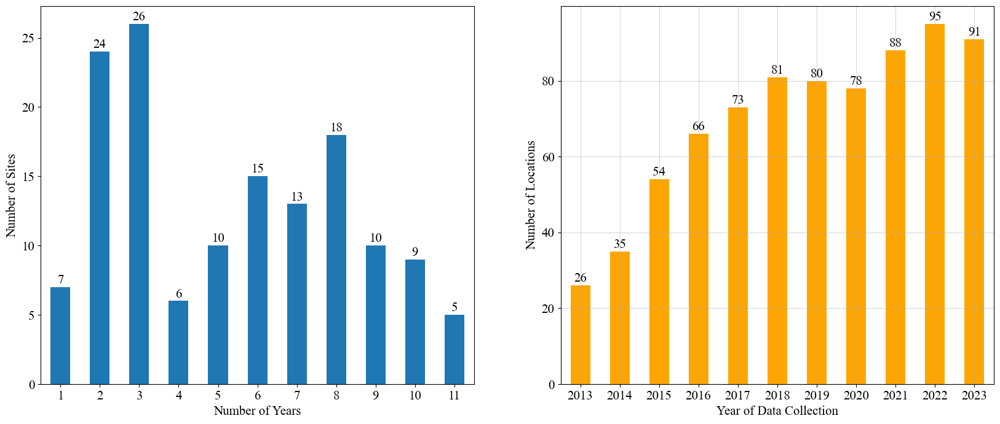

In [17]:
# inspect number of year's data each site span
fig, ax = plt.subplots(1, 2, figsize = (20, 8))

ax1 = longterm.groupby(['site_id', 'Facility_Class'])['year'].nunique().sort_values(ascending = False).reset_index().groupby('year')['site_id'].nunique().plot(kind = 'bar', xlabel = 'Number of Years', ax = ax[0], rot = 0)
ax2 = longterm.groupby('year')['site_id'].nunique().sort_index().plot(kind = 'bar', ax = ax[1], xlabel = 'Year of Data Collection', color = 'orange', ylabel = 'Number of Locations', rot = 0)

ax1.set_ylabel('Number of Sites')

for ax_ in ax:
    for bar in ax_.patches:
        ax_.annotate(format(bar.get_height(), '.0f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha = 'center', va = 'center',
                     size = 15, xytext = (0, 8),
                     textcoords = 'offset points')
        
plt.rcParams.update({'font.size': 15})
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
plt.grid(alpha = 0.5)
    
print('8 sites have only one year data while 5 sites have 11 years of data.')              

In [78]:
longterm.groupby('year').agg({'Number_of_days_data_collected_inyear': ['min', 'max', 'mean']}).T

year                                             2013        2014       2015  \
Number_of_days_data_collected_inyear min   153.000000   28.000000   27.00000   
                                     max   365.000000  365.000000  365.00000   
                                     mean  335.064044  324.890144  313.86243   

year                                             2016       2017        2018  \
Number_of_days_data_collected_inyear min    22.000000   30.00000   26.000000   
                                     max   366.000000  365.00000  365.000000   
                                     mean  329.015895  323.93747  323.250399   

year                                             2019       2020        2021  \
Number_of_days_data_collected_inyear min    25.000000   25.00000   29.000000   
                                     max   365.000000  366.00000  365.000000   
                                     mean  328.995191  316.10061  296.871251   

year                                             2022        2023  
Number_of_days_data_collected_inyear min    21.000000   26.000000  
                                     max   365.000000  304.000000  
                                     mean  307.093947  266.687359

In [5]:
print(longterm.groupby(['site_id','year'])['Number_of_days_data_collected_inyear'].mean().unstack().sum(axis = 1).describe())
print('Number of days data a site have range from 22 to 3943 days.')

count     153.000000
mean     1446.281046
std       967.740637
min        22.000000
25%       632.000000
50%      1277.000000
75%      2152.000000
max      3954.000000
dtype: float64
Number of days data a site have range from 22 to 3943 days.


In [24]:
# Number of days' records a site have for each year
df = pd.DataFrame(longterm[nontrail_mask].groupby(['site_id','year'])['Number_of_days_data_collected_inyear'].mean()).unstack()
num_of_loc = len(df) - df.isna().sum()
min_ = df.min(axis = 0)
max_ = df.max(axis = 0)
df.loc['min', :] = min_
df.loc['max', :] = max_
df.loc['# Locations', :] = num_of_loc
df.loc[['min', 'max', '# Locations'], :]

Number_of_days_data_collected_inyear                              \
year                                        2013   2014   2015   2016   2017   
site_id                                                                        
min                                        184.0   92.0   53.0   22.0   30.0   
max                                        364.0  363.0  365.0  366.0  365.0   
# Locations                                  5.0    8.0   11.0   13.0   15.0   

                                                       
year          2018   2019   2020   2021   2022   2023  
site_id                                                
min           26.0   25.0   48.0   29.0   73.0   26.0  
max          364.0  365.0  366.0  365.0  365.0  304.0  
# Locations   16.0   18.0   20.0   34.0   50.0   52.0

## IV. Activity Patterns Visualization

In [16]:
n_yr = longterm.groupby(['site_id'])['year'].nunique().reset_index().rename(columns = {'year': 'n_yr'})
locations = locations.merge(n_yr, on = 'site_id')

In [17]:
yr_set = longterm.groupby(['site_id'])['year'].unique().reset_index()
locations = locations.merge(yr_set, on = 'site_id')

In [18]:
locations['name_year'] = locations.apply(lambda x: x.site_name + ' ' + str(x.year), axis = 1)

In [19]:
# locations.head()

In [20]:
# Visualize the sites
import plotly.express as px

fig = px.scatter_mapbox(locations, 
                        lat = 'latitude', lon = 'longitude', 
                        hover_name = 'name_year', 
                        color = 'Classification',
                        size = 'n_yr',
                        zoom = 8, height = 600, width = 1600)

fig.update_layout(mapbox_style = 'open-street-map')
fig.show()

In [25]:
def hour_to_week(site_name, city):
    
    s = longterm[longterm.site_name == site_name]
    hour_to_week_by_year = s.groupby(['year', 'dayofweek', 'Start Time'])['hourly_counts'].mean().unstack('year')
    n_year = len(hour_to_week_by_year.columns)
    
    if n_year >= 5:
        axes = hour_to_week_by_year.plot(subplots = True, layout = (2, math.ceil(n_year/2)), figsize = (n_year * 3, 8), sharey = True)
    else:
        axes = hour_to_week_by_year.plot(subplots = True, layout = (1, n_year), figsize = (n_year * 5, 4), sharey = True)
    for ax in axes.flat:
        ax.set_xticks([12, 36, 60, 84, 108, 132, 156], ['Mon', 'Tu', 'Wed', 'Th', 'Fri', 'Sat', 'Sun'])
        ax.set_xlabel('')
        ax.set_ylabel('Average hourly counts')
        
    plt.gcf().suptitle('site_id: {} ({}), {}'.format(locations[locations.site_name == site_name].site_id.values[0], locations[locations.site_name == site_name].Classification.values[0], city), fontsize = 16)
    
    plt.show()
    plt.rcParams.update({'font.size': 14})

In [26]:
from util import get_num_wday
def impute_month_traffic(site_name):
    s = longterm[longterm.site_name == site_name]
    dv = s.groupby(['year', 'month', 'dayofweek', 'day'])['hourly_counts'].sum().reset_index().rename(columns = {'hourly_counts': 'daily_counts'})
    wadt = dv.groupby(['year', 'month', 'dayofweek'])['daily_counts'].mean().reset_index().rename(columns = {'daily_counts': 'wadt'})
    wadt['num'] = wadt.apply(lambda x: get_num_wday(x), axis = 1)
    wadt['wday_total'] = wadt['num'] * wadt['wadt']
    month_to_year_by_year = wadt.groupby(['year', 'month'])['wday_total'].sum().unstack()
    display(month_to_year_by_year)
    return month_to_year_by_year.T

def visualize_selected_mty(month_to_year_by_year, site_name, city):

    n_year = len(month_to_year_by_year.columns)
    if n_year >= 5:
        axes = month_to_year_by_year.plot(subplots = True, layout = (2, math.ceil(n_year/2)), figsize = (n_year * 3, 8), sharey = True)
    else:
        axes = month_to_year_by_year.plot(subplots = True, layout = (1, n_year), figsize = (n_year * 5, 4), sharey = True)
    for ax in axes.flat:
        ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12], ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'], rotation = 90)
        ax.set_xlabel('')
        ax.set_ylabel('Total monthly traffic')
    plt.gcf().suptitle('site_id: {}, {}'.format(locations[locations.site_name == site_name].site_id.values[0], city), fontsize = 16)
    plt.show()

In [27]:
locations.site_name.to_list()

['1037 BB near IB - Vandalized',
 '5335 W. Adams Blvd. (SLID: 91324)',
 '5350 W. Adams Blvd. (SLID: 91331)',
 '7th St between Hill St to Broadway St, north side',
 '7th St between Hill St to Broadway St, south side',
 '9439 Santa Monica Blvd',
 'ACTC4_Emeryville_Greenway',
 'Alamo Canal Trail - 580 Undercrossing',
 'Albany Bay Trail',
 'Aliso / Creekside (X2H75078077)',
 'Aliso Creek @ Aliso and Wood Canyon',
 'Alvarado St between 6th St and 7th St, west side',
 'Arguello Blvd.',
 'Avalon between 48th St and 49th St, east side',
 'Avalon between 50th St and 51st St, west side',
 'BART AT SPIRE',
 'BART arg Trail',
 'BART/Anza_RH_to_Lincoln',
 'BARTCentralMag',
 'BTEL',
 'Ballona Creek Bike Path',
 'Bayshore Bikeway (Chula Vista)',
 'Bayview (2H15078076)',
 'Bellview / Dove Canyon',
 'Benicia (Martinez)',
 'Bob Jones Trail',
 'Bob Jones Trail',
 'Broadway between 97th St to 98th St, east side',
 'Broadway between 97th St to 98th St, west side',
 'CF2 West Crissy',
 'Carquinez (Crockett)

- Eurake
'PedBikeCorpYard'
'HBTN Samoa'
'Foster Avenue'
- Davis
'Loyola PYRO-Box'
- SF Bay
'East Bay Greenway'
'Ecology Trail'
- Lake Tahoe
'Shared-use path - Ski Run to El Dorado Beach'
'Shared-use path - Camp Richardson'
- LA
'Hill (SLID: 204870)'
'Los Angeles River Bike Path'
- Fresno
'Dry Creek Trail'
'Old Town Trail'
- San Diego
'SD University Ave EB & WB - Ped'

In [32]:
site_name = 'East Bay Greenway'
longterm[longterm.site_name == site_name].groupby(['year', 'month'])['day'].nunique().unstack()

month,1,2,3,4,5,6,7,8,9,10,11,12
year,,,,,,,,,,,,
2015,NaN,NaN,NaN,NaN,NaN,22.0,31.0,29.0,28.0,31.0,30.0,31.0
2016,31.0,29.0,31.0,30.0,31.0,30.0,31.0,31.0,30.0,31.0,30.0,31.0
2017,31.0,28.0,31.0,30.0,31.0,30.0,31.0,31.0,30.0,31.0,30.0,31.0
2018,31.0,28.0,31.0,30.0,28.0,30.0,31.0,31.0,30.0,29.0,NaN,31.0
2019,31.0,28.0,31.0,30.0,31.0,30.0,31.0,31.0,30.0,31.0,30.0,31.0
2020,31.0,29.0,31.0,30.0,31.0,30.0,31.0,31.0,30.0,31.0,30.0,31.0
2021,30.0,28.0,31.0,30.0,31.0,30.0,31.0,31.0,30.0,31.0,30.0,31.0
2022,31.0,28.0,31.0,30.0,31.0,30.0,31.0,NaN,NaN,NaN,NaN,NaN
2023,31.0,28.0,31.0,30.0,31.0,30.0,31.0,31.0,30.0,31.0,NaN,NaN


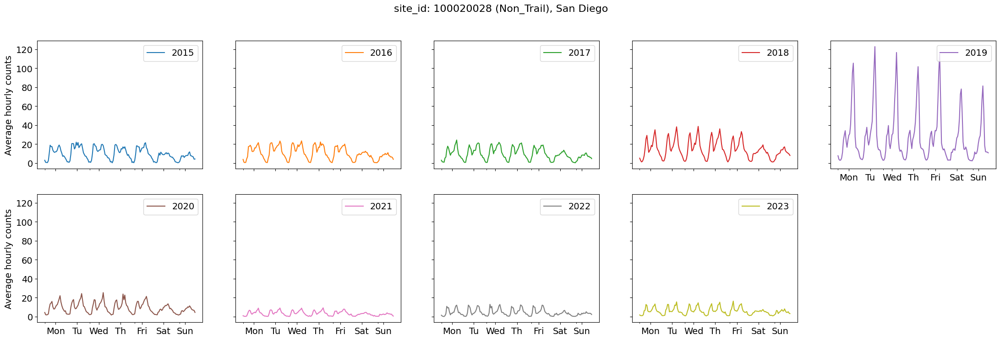

In [33]:
hour_to_week(site_name, 'San Diego')

In [155]:
df = impute_month_traffic(site_name)

month,1,2,3,4,5,6,7,8,9,10,11,12
year,,,,,,,,,,,,
2013,91587.00,83399.000000,93664.0,81566.0,69402.000000,56453.000000,60472.000000,50042.0,39871.0,47397.000000,50533.333333,54710.00
2014,52871.00,42248.666667,67689.0,59143.0,60352.000000,53153.000000,56742.000000,53537.0,47525.0,52751.000000,59270.000000,47625.00
2015,10252.25,12341.000000,9154.0,2295.0,17511.333333,24099.333333,31663.000000,39237.0,30843.0,29025.000000,39752.000000,28161.25
2016,51933.25,48463.000000,45514.0,39251.0,37341.000000,30131.000000,33142.000000,21699.0,23263.0,21600.750000,26648.333333,36682.00
2017,69252.00,60508.000000,73416.0,68263.0,61080.000000,58670.000000,63845.666667,56074.0,49444.0,52045.000000,47226.166667,NaN
2020,NaN,NaN,NaN,NaN,NaN,37376.833333,33011.000000,31573.0,33495.0,28379.333333,NaN,NaN


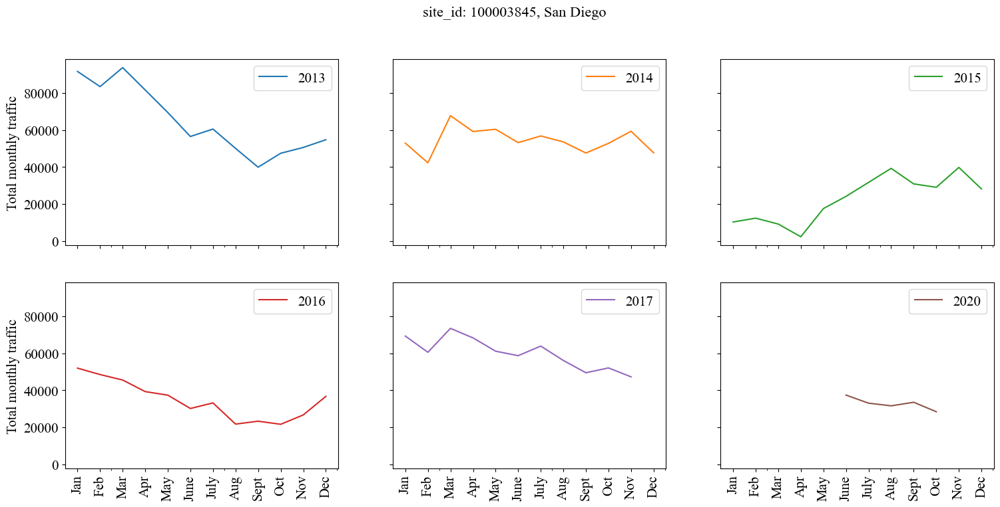

In [171]:
visualize_selected_mty(df, site_name, 'San Diego')

In [137]:
# axes = s1[s1.year == 2018].groupby(['month', 'dayofweek', 'Start Time'])['hourly_counts'].mean().unstack('month').plot(subplots = True, layout = (1, 8), figsize = (36, 4), sharey = True)
# for ax in axes.flat:
#     ax.set_xticks([12, 36, 60, 84, 108, 132, 156], ['Mon', 'Tu', 'Wed', 'Th', 'Fri', 'Sat', 'Sun'])
#     ax.set_xlabel('')
#     ax.set_ylabel('Average hourly count')

### 1) Hour of week

Trail has a more obvious weekend peak than non-trails.

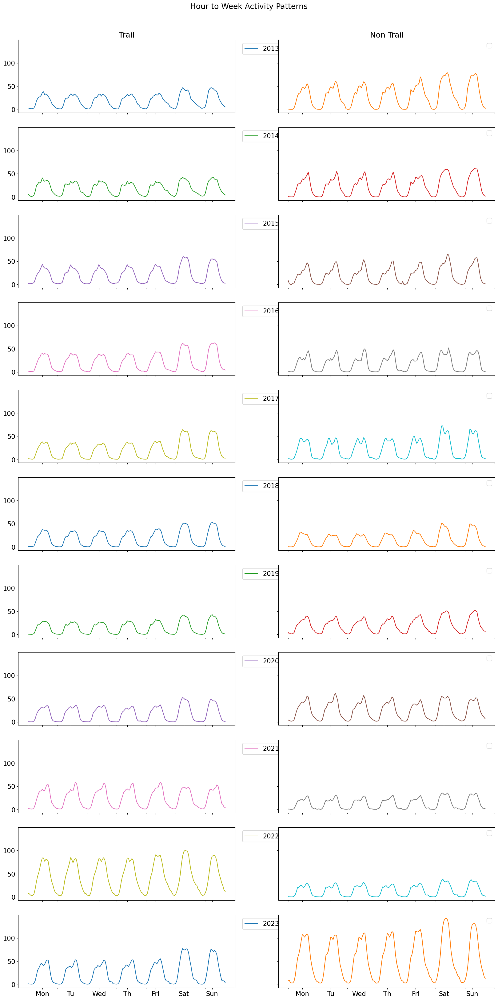

In [12]:
df1 = longterm[~nontrail_mask].groupby(['year', 'dayofweek', 'Start Time'])['hourly_counts'].mean().unstack('year')
df2 = longterm[nontrail_mask].groupby(['year', 'dayofweek', 'Start Time'])['hourly_counts'].mean().unstack('year')
axes = pd.concat([df1, df2], axis = 1).sort_index(axis = 1).plot(subplots = True, figsize = (20, 40), 
                                                                 layout = (11, 2), sharey = True)
for ax0, ax1 in axes:
    ax0.set_xticks([12, 36, 60, 84, 108, 132, 156], ['Mon', 'Tu', 'Wed', 'Th', 'Fri', 'Sat', 'Sun'])
    ax1.set_xticks([12, 36, 60, 84, 108, 132, 156], ['Mon', 'Tu', 'Wed', 'Th', 'Fri', 'Sat', 'Sun'])
    ax0.set_xlabel('')
    ax1.set_xlabel('') 
    ax0.legend(bbox_to_anchor = (1.23, 1))
    ax1.legend('')

axes[0][0].set_title('Trail')
axes[0][1].set_title('Non Trail')
plt.gcf().suptitle('Hour to Week Activity Patterns', y = 0.91)
plt.rcParams.update({'font.size': 18})

### 2) Hour of day

The volume for non-trail location is particularly high during weekdays in the afternoon in 2020 and 2021.

Text(0.5, 0.91, 'Hour of Weekday')

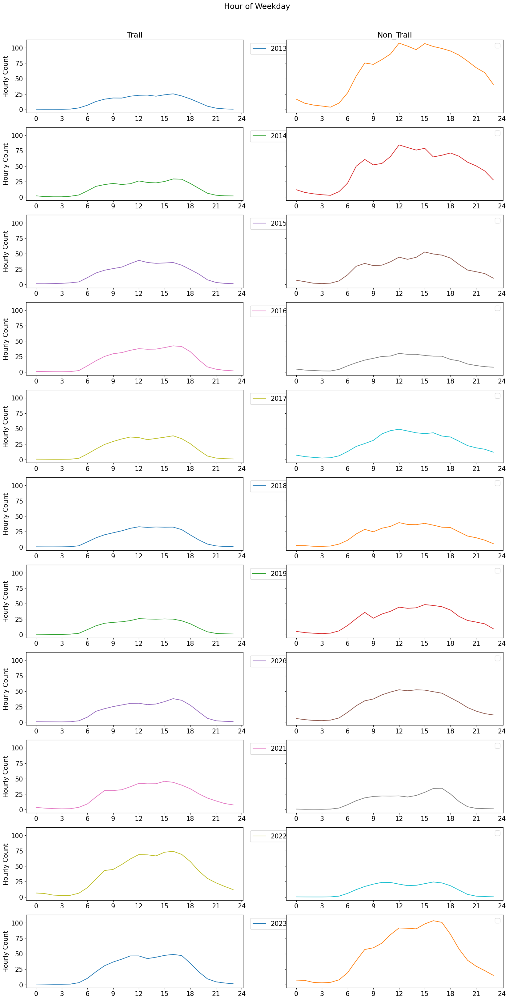

In [21]:
nontrail_mask = longterm.Classification == 'Non_Trail'
weekday_mask = longterm.dayofweek <= 4
df1 = longterm[~nontrail_mask & weekday_mask].groupby(['year', 'Start Time'])['hourly_counts'].mean().unstack('year').reset_index(drop = True)
df2 = longterm[nontrail_mask & weekday_mask].groupby(['year', 'Start Time'])['hourly_counts'].mean().unstack('year').reset_index(drop = True)
axes = pd.concat([df1, df2], axis = 1).sort_index(axis = 1).plot(subplots = True, figsize = (20, 40), layout = (11, 2), sharey = True, sharex = False)

for ax0, ax1 in axes:
    ax0.set_xticks([0, 3, 6, 9, 12, 15, 18, 21, 24])
    ax1.set_xticks([0, 3, 6, 9, 12, 15, 18, 21, 24])
    ax0.legend(bbox_to_anchor = (1.23, 1))
    ax1.legend('')
    ax0.set_ylabel('Hourly Count')
    
axes[0][0].set_title('Trail')
axes[0][1].set_title('Non_Trail')

plt.gcf().suptitle('Hour of Weekday', y = 0.91)

Text(0.5, 0.91, 'Hour of Weekend')

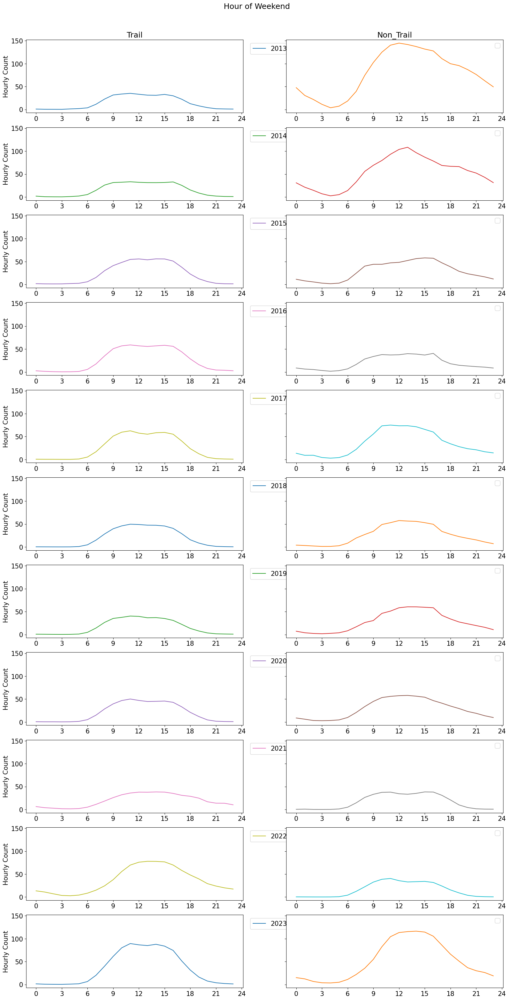

In [22]:
df1 = longterm[~nontrail_mask & ~weekday_mask].groupby(['year', 'Start Time'])['hourly_counts'].mean().unstack('year').reset_index(drop = True)
df2 = longterm[nontrail_mask & ~weekday_mask].groupby(['year', 'Start Time'])['hourly_counts'].mean().unstack('year').reset_index(drop = True)
axes = pd.concat([df1, df2], axis = 1).sort_index(axis = 1).plot(subplots = True, figsize = (20, 40), layout = (11, 2), sharey = True, sharex = False)

for ax0, ax1 in axes:
    ax0.set_xticks([0, 3, 6, 9, 12, 15, 18, 21, 24])
    ax1.set_xticks([0, 3, 6, 9, 12, 15, 18, 21, 24])
    ax0.legend(bbox_to_anchor = (1.23, 1))
    ax1.legend('')
    ax0.set_ylabel('Hourly Count')
    
axes[0][0].set_title('Trail')
axes[0][1].set_title('Non_Trail')

plt.gcf().suptitle('Hour of Weekend', y = 0.91)

### 3) Day of week

Text(0.5, 0.91, 'Day of Week')

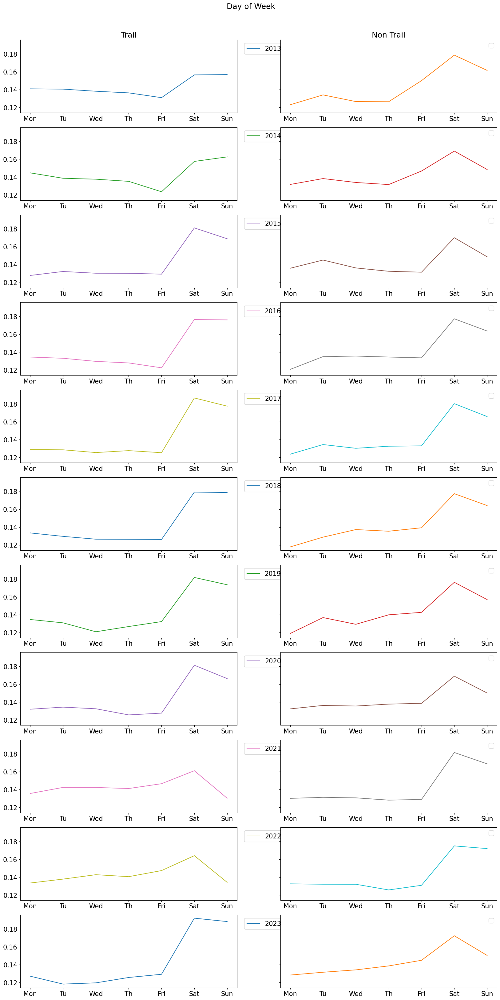

In [23]:
df_t = longterm[~nontrail_mask].groupby(['site_id', 'year', 'weekno', 'dayofweek'])['hourly_counts'].sum().unstack('dayofweek').reset_index().dropna(axis = 0)
df_t.iloc[:, 3:] = df_t.iloc[:, 3:].div(df_t.iloc[:, 3:].sum(axis = 1), axis = 0) 
df1 = df_t.groupby('year')[[0, 1, 2, 3, 4, 5, 6]].mean().T
df_t = longterm[nontrail_mask].groupby(['site_id', 'year', 'weekno', 'dayofweek'])['hourly_counts'].sum().unstack('dayofweek').reset_index().dropna(axis = 0)
df_t.iloc[:, 3:] = df_t.iloc[:, 3:].div(df_t.iloc[:, 3:].sum(axis = 1), axis = 0) 
df2 = df_t.groupby('year')[[0, 1, 2, 3, 4, 5, 6]].mean().T


axes = pd.concat([df1, df2], axis = 1).sort_index(axis = 1).plot(subplots = True, figsize = (20, 40), 
                                     layout = (11, 2), sharey = True, sharex = False, xticks = range(7), title = 'Day of Week')

for ax0, ax1 in axes:
    ax0.set_xticks([0, 1, 2, 3, 4, 5, 6], ['Mon', 'Tu', 'Wed', 'Th', 'Fri', 'Sat', 'Sun'])
    ax1.set_xticks([0, 1, 2, 3, 4, 5, 6], ['Mon', 'Tu', 'Wed', 'Th', 'Fri', 'Sat', 'Sun']) 
    ax0.set_xlabel('')
    ax1.set_xlabel('')
    ax0.legend(bbox_to_anchor = (1.23, 1))
    ax1.legend('')
    
axes[0][0].set_title('Trail')
axes[0][1].set_title('Non Trail')
    
plt.gcf().suptitle('Day of Week', y = 0.91)


### 4) Month of year

In [25]:
import calendar
longterm['full month'] = longterm.apply(lambda x: calendar.monthrange(x.year,x.month)[1] == x.Number_of_days_data_collected, axis = 1)

#### Only locations with full month collected data are included

In [26]:
longterm[~nontrail_mask & (longterm['full month'] == True)].groupby(['site_id', 'year', 'month'])['hourly_counts'].sum().unstack('month').dropna(axis = 0).reset_index().groupby('year')['site_id'].nunique()

year
2013     3
2014     3
2015     6
2016     8
2017    10
2018    10
2019     7
2020     5
2021     4
2022     4
Name: site_id, dtype: int64

In [27]:
longterm[nontrail_mask & (longterm['full month'] == True)].groupby(['site_id', 'year', 'month'])['hourly_counts'].sum().unstack('month').dropna(axis = 0).reset_index().groupby('year')['site_id'].nunique()

year
2015    1
2016    2
2017    2
2019    3
2020    5
2021    1
2022    7
Name: site_id, dtype: int64

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 0.91, 'Monthly Activity Pattern')

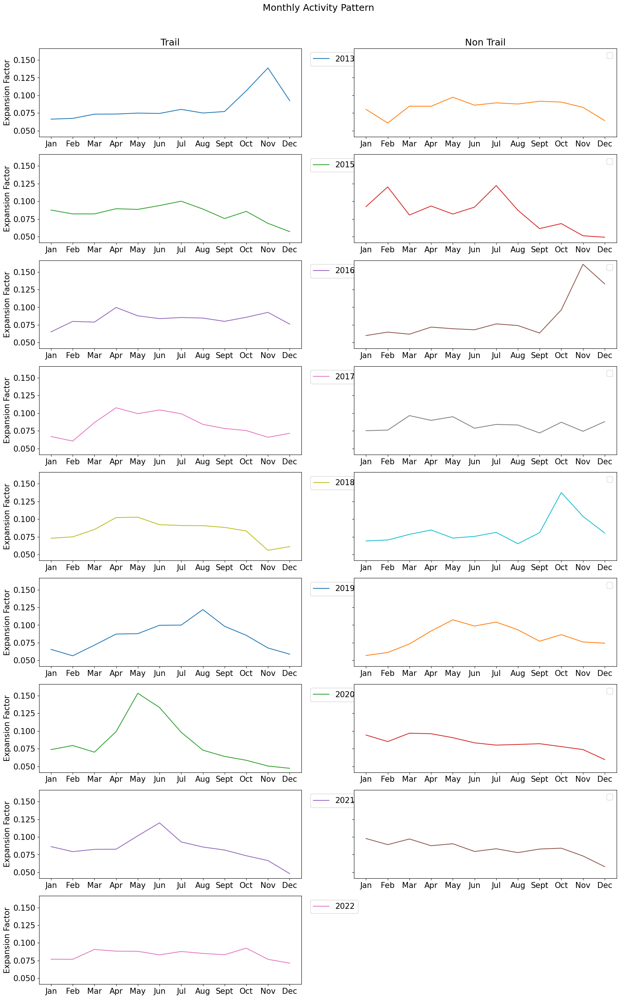

In [28]:
df1 = longterm[~nontrail_mask & (longterm['full month'] == True)].groupby(['site_id', 'year', 'month'])['hourly_counts'].sum().unstack('month').dropna(axis = 0)
df1 = df1.div(df1.sum(axis = 1), axis = 0).reset_index().groupby('year')[[1,2,3,4,5,6,7,8,9,10,11,12]].mean().T
df2 = longterm[nontrail_mask & (longterm['full month'] == True)].groupby(['site_id', 'year', 'month'])['hourly_counts'].sum().unstack('month').dropna(axis = 0)
df2 = df2.div(df2.sum(axis = 1), axis = 0).reset_index().groupby('year')[[1,2,3,4,5,6,7,8,9,10,11,12]].mean().T
axes = pd.concat([df1, df2], axis = 1).sort_index(axis = 1).plot(subplots = True, figsize = (20, 40), layout = (11, 2), sharey = True, sharex = False)
for ax0, ax1 in axes:
    ax0.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12], ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'])
    ax1.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12], ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'])
    ax0.set_xlabel('')
    ax1.set_xlabel('')
    ax0.legend(bbox_to_anchor = (1.23, 1))
    ax1.legend('')
    ax0.set_ylabel('Expansion Factor')

axes[0][0].set_title('Trail')
axes[0][1].set_title('Non Trail')
plt.gcf().suptitle('Monthly Activity Pattern', y = 0.91)

### 5) Year average

In [26]:
MADT = longterm.groupby(['site_id', 'year', 'month', 'weekno', 'dayofweek'])['hourly_counts'].sum().unstack().reset_index().groupby(['site_id', 'year', 'month'])[[0,1,2,3,4,5,6]].mean().mean(axis = 1).unstack()
MADT = MADT.reset_index().dropna(axis = 0)
MADT['AADT'] = MADT[[1,2,3,4,5,6,7,8,9,10,11,12]].mean(axis = 1)
MADT.groupby('year')['site_id'].nunique()

year
2013    21
2014    21
2015    23
2016    39
2017    39
2018    38
2019    47
2020    38
2021    26
2022    38
Name: site_id, dtype: int64

In [27]:
MADT.groupby(['site_id'])['year'].nunique().sort_values(ascending = False).head(10)

site_id
100002761    10
100000595     9
100018253     8
100003261     8
100003561     7
100013757     7
100007080     7
100000671     7
100021589     7
100003433     6
Name: year, dtype: int64

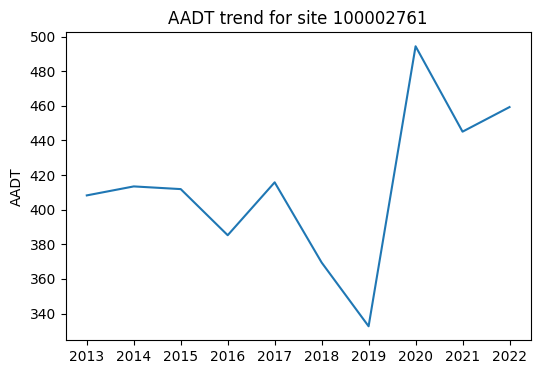

In [29]:
ax = MADT[MADT.site_id == 100002761]['AADT'].plot(figsize = (6, 4))
ax.set_xticks([i for i in range(37, 47)], [i for i in range(2013, 2023)])
ax.set_ylabel('AADT')
ax.set_title('AADT trend for site 100002761')
plt.rcParams.update({'font.size': 5})

In [ ]:
print(longterm.groupby(['site_id', 'dayofweek'])['Start Time'].nunique().unstack().sum(axis = 1).min())
print('Every site have hourly count data for each one hour slot across a week.')
print('------------------------------------------------------------------------------------------------------')
print(longterm.groupby(['site_id', 'dayofweek', 'Start Time'])['hourly_counts'].size().sort_values().head())
print('Some have only one observation for a specific time slot, which might yield weird pattern if the count collected on that day happen to be abnormal.')

## V. Save Data

In [28]:
### weekday_Status, duration, timestamp, Number_of_xxx, Daily_Counts, can be dropped
longterm.drop(columns = ['Facility_Class', 'Bicycle_Fa',
                         'weekday_Status', 'duration', 'timestamp', 
                         'Number_of_hrs_data_collected', 'Number_of_days_data_collected', 'Number_of_days_data_collected_inyear', 
                         'Daily_Counts', 'site_name'], inplace = True)

# longterm.to_csv('data/longterm.csv', index = False)
longterm.to_csv('data/longterm_combine_site.csv', index = False)